# Multivariate GHG Emission Clustering with CO2 and Socioeconomic Data: *Exploratory Data Analysis*

GE Vernova (Team 2): Dan Dryer, Joanna Rashid, Nhu Y Pham

In [1]:
#load packages
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

In [2]:
#read in the combined co2 and svi data
local_path=r'C:/Users/ddrye/OneDrive/Documents/OMSA_Program/OMSA 2023\Summer2023/Practicum/off_git/data/'
df=pd.read_csv(local_path+r"2014_2020_all_tract.csv")

### View general schema and description

In [3]:
pd.set_option('display.max_columns', None)
display(df.head(3))
df.describe()

,longitude,latitude,FIPS,avg_co2,year,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS.1,LOCATION,year.1,total_population,housing_units,num_households,unemployment,socioeconomic,household_comp,minority_status,housing_type,overall_svi,xco2_std,co2_1yr_change,co2_6yr_change,co2_1yr_pct_change,co2_6yr_pct_change,co2_5yr_pct_change,co2_4yr_pct_change,co2_3yr_pct_change,co2_2yr_pct_change
0,-74.5,40.5,34005702808,400.576686,2015,34.0,New Jersey,NJ,34005.0,Burlington,34005702808,"Census Tract 7028.08, Burlington County, New J...",2015,3198.5,1113.0,1052.5,235.0,0.67105,0.72955,0.84655,0.1561,0.60690,2.817643,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-74.5,40.5,34005702808,410.654556,2019,34.0,New Jersey,NJ,34005.0,Burlington,34005702808,"Census Tract 7028.08, Burlington County, New J...",2019,3415.0,1138.5,1055.5,120.5,0.57505,0.75375,0.85460,0.0660,0.46885,2.893552,10.077871,NaN,0.025158,NaN,NaN,NaN,NaN,NaN
2,-74.5,40.5,34005702808,413.296552,2020,34.0,New Jersey,NJ,34005.0,Burlington,34005702808,"Census Tract 7028.08, Burlington County, New J...",2020,3447.0,1141.0,1053.0,77.0,0.58480,0.68890,0.92850,0.0703,0.45420,2.789300,2.641996,NaN,0.006434,NaN,NaN,NaN,NaN,0.031754


,longitude,latitude,FIPS,avg_co2,year,ST,STCNTY,FIPS.1,year.1,total_population,housing_units,num_households,unemployment,socioeconomic,household_comp,minority_status,housing_type,overall_svi,xco2_std,co2_1yr_change,co2_6yr_change,co2_1yr_pct_change,co2_6yr_pct_change,co2_5yr_pct_change,co2_4yr_pct_change,co2_3yr_pct_change,co2_2yr_pct_change
count,485366.000000,485366.000000,4.853660e+05,485366.000000,485366.000000,485366.000000,485366.000000,4.853660e+05,485366.000000,485366.000000,485366.000000,485366.000000,485366.000000,485366.000000,485366.000000,485366.000000,485366.000000,485366.000000,485366.000000,412917.000000,62011.000000,412917.000000,62011.000000,123121.000000,195570.000000,268019.000000,340468.000000
mean,-91.318922,37.884322,2.786206e+10,405.297424,2016.882892,27.775852,27861.799879,2.786206e+10,2016.882892,4270.770834,1806.093518,1586.602549,151.031835,-7.029511,-5.998009,-4.897948,-6.796264,-7.407435,2.237047,0.015710,0.151132,0.000215,0.000559,0.000189,-0.000126,-0.000074,0.000118
std,15.776302,5.082026,1.580793e+10,5.048107,1.967025,15.784259,15807.928453,1.580793e+10,1.967025,2057.206498,832.108895,738.051314,114.160337,85.479797,79.543718,72.792417,84.071361,87.593054,0.562484,7.591815,7.711754,0.018733,0.019047,0.020146,0.019000,0.019149,0.018505
min,-167.500000,25.500000,1.001020e+09,395.892359,2014.000000,1.000000,1001.000000,1.001020e+09,2014.000000,0.000000,0.000000,0.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,0.906687,-16.194244,-16.096046,-0.039197,-0.039042,-0.039342,-0.039213,-0.039062,-0.039310
25%,-97.500000,34.500000,1.211998e+10,400.476138,2015.000000,12.000000,12119.000000,1.211998e+10,2015.000000,2874.000000,1254.500000,1087.500000,72.500000,0.248812,0.259800,0.246100,0.254500,0.250000,1.728153,-5.915441,-6.004117,-0.014656,-0.014809,-0.015841,-0.014297,-0.014612,-0.013938
50%,-86.500000,38.500000,2.714317e+10,405.795074,2017.000000,27.000000,27143.000000,2.714317e+10,2017.000000,4022.000000,1709.500000,1507.000000,124.000000,0.500550,0.504500,0.495900,0.502800,0.501750,2.250151,1.949132,1.819606,0.004833,0.004482,0.004563,-0.005095,-0.004439,-0.004154
75%,-79.500000,41.500000,4.103336e+10,409.969879,2019.000000,41.000000,41033.000000,4.103336e+10,2019.000000,5348.000000,2244.000000,1988.500000,199.000000,0.750650,0.745400,0.745300,0.749400,0.752000,2.726964,5.952548,5.799454,0.014887,0.014594,0.016814,0.014374,0.014554,0.014236
max,-67.500000,64.500000,5.604595e+10,414.554260,2020.000000,56.000000,56045.000000,5.604595e+10,2020.000000,70271.000000,26436.000000,21337.000000,2364.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.853587,16.137922,16.137922,0.040699,0.040620,0.040918,0.040650,0.040814,0.040830


It has since been changed, but an early catch was that there are negative values (-999 to be specific) present for some of the SVI fields. These represent census tracts in which there was no population or there was no reading taken. For the purposes of this analysis, these values have been dropped.

### Identify Outliers

Box Plots and distributions Prior to Dropping SVI Outliers

array([[<Axes: title={'center': 'total_population'}>,
        <Axes: title={'center': 'housing_units'}>,
        <Axes: title={'center': 'num_households'}>,
        <Axes: title={'center': 'unemployment'}>],
       [<Axes: title={'center': 'socioeconomic'}>,
        <Axes: title={'center': 'household_comp'}>,
        <Axes: title={'center': 'minority_status'}>,
        <Axes: title={'center': 'housing_type'}>],
       [<Axes: title={'center': 'overall_svi'}>,
        <Axes: title={'center': 'avg_co2'}>,
        <Axes: title={'center': 'xco2_std'}>,
        <Axes: title={'center': 'co2_1yr_change'}>],
       [<Axes: title={'center': 'co2_6yr_change'}>,
        <Axes: title={'center': 'co2_1yr_pct_change'}>,
        <Axes: title={'center': 'co2_6yr_pct_change'}>,
        <Axes: title={'center': 'co2_5yr_pct_change'}>],
       [<Axes: title={'center': 'co2_4yr_pct_change'}>,
        <Axes: title={'center': 'co2_3yr_pct_change'}>,
        <Axes: title={'center': 'co2_2yr_pct_change'}>, <Ax

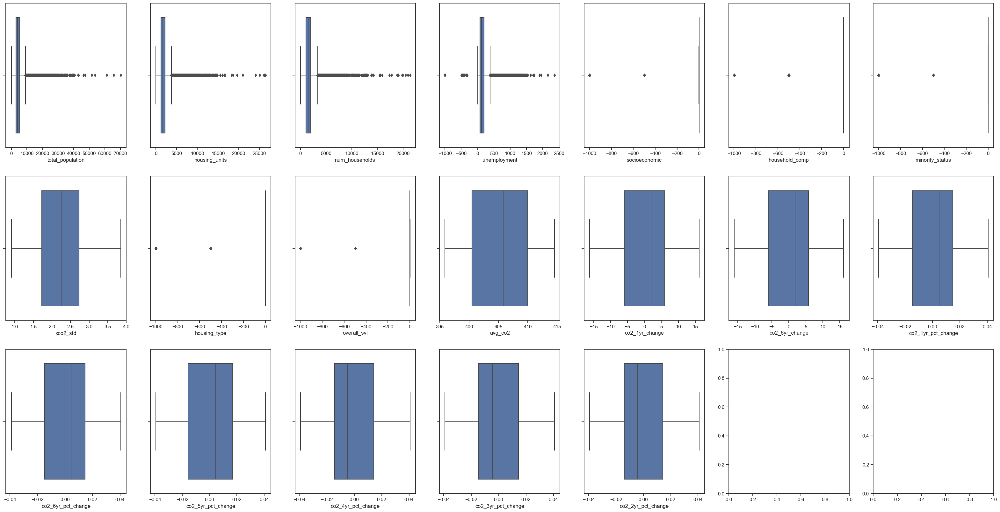

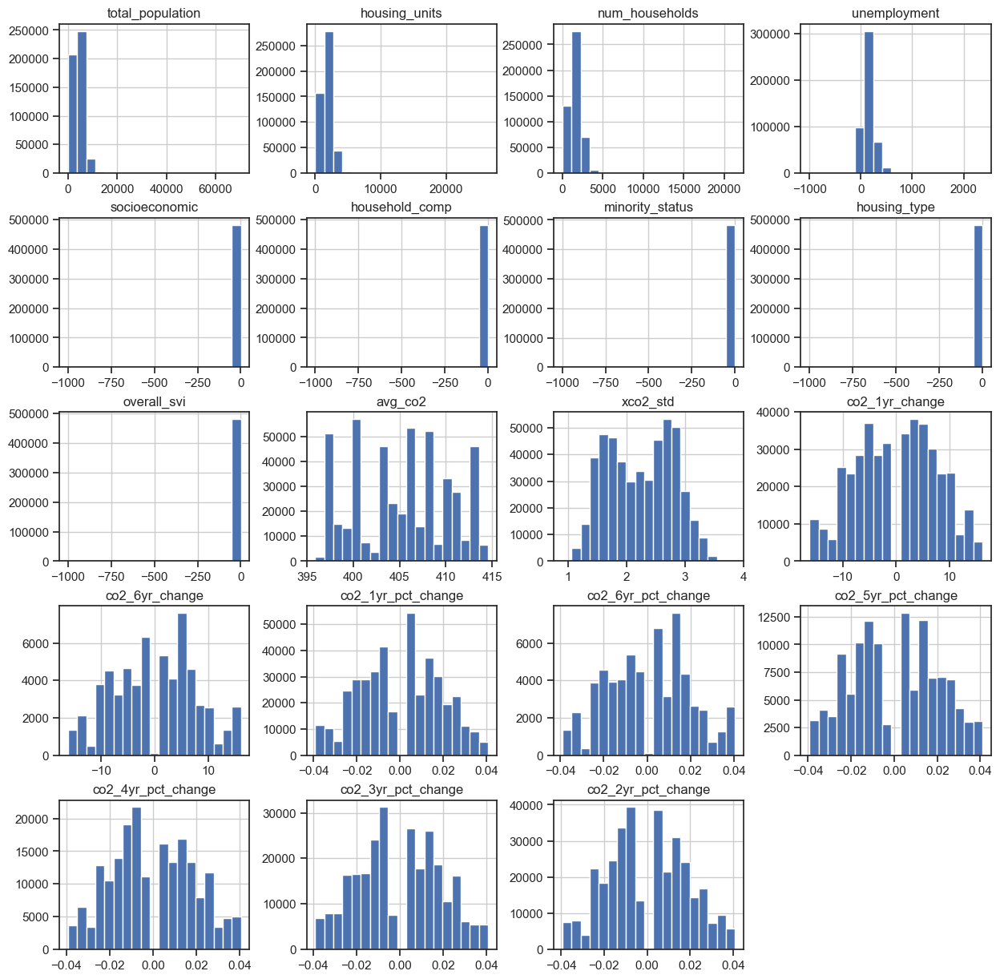

In [33]:
#focussing on only the numeric fields
forplot=df[['total_population', 'housing_units','num_households', 'unemployment', 'socioeconomic', 'household_comp','minority_status', 'housing_type',
        'overall_svi', 'avg_co2', 'xco2_std','co2_1yr_change', 'co2_6yr_change', 'co2_1yr_pct_change','co2_6yr_pct_change',
        'co2_5yr_pct_change', 'co2_4yr_pct_change','co2_3yr_pct_change', 'co2_2yr_pct_change']]

fig, ax =plt.subplots(3,7, figsize=(40, 20))

sns.boxplot(data=forplot, x='total_population', ax=ax[0,0])
sns.boxplot(data=forplot, x='housing_units', ax=ax[0,1])
sns.boxplot(data=forplot, x='num_households', ax=ax[0,2])
sns.boxplot(data=forplot, x='unemployment', ax=ax[0,3])
sns.boxplot(data=forplot, x='socioeconomic', ax=ax[0,4])
sns.boxplot(data=forplot, x='household_comp', ax=ax[0,5])
sns.boxplot(data=forplot, x='minority_status', ax=ax[0,6])

sns.boxplot(data=forplot, x='xco2_std', ax=ax[1,0])
sns.boxplot(data=forplot, x='housing_type', ax=ax[1,1])
sns.boxplot(data=forplot, x='overall_svi', ax=ax[1,2])
sns.boxplot(data=forplot, x='avg_co2', ax=ax[1,3])
sns.boxplot(data=forplot, x='co2_1yr_change', ax=ax[1,4])
sns.boxplot(data=forplot, x='co2_6yr_change', ax=ax[1,5])
sns.boxplot(data=forplot, x='co2_1yr_pct_change', ax=ax[1,6])

sns.boxplot(data=forplot, x='co2_6yr_pct_change', ax=ax[2,0])
sns.boxplot(data=forplot, x='co2_5yr_pct_change', ax=ax[2,1])
sns.boxplot(data=forplot, x='co2_4yr_pct_change', ax=ax[2,2])
sns.boxplot(data=forplot, x='co2_3yr_pct_change', ax=ax[2,3])
sns.boxplot(data=forplot, x='co2_2yr_pct_change', ax=ax[2,4])

forplot.hist(bins=19, figsize=(15, 15))


### Drop outliers

Box plots and distributions post dropping SVI outliers

distribution over all years


array([[<Axes: title={'center': 'longitude'}>,
        <Axes: title={'center': 'latitude'}>,
        <Axes: title={'center': 'FIPS'}>,
        <Axes: title={'center': 'avg_co2'}>,
        <Axes: title={'center': 'year'}>],
       [<Axes: title={'center': 'ST'}>,
        <Axes: title={'center': 'STCNTY'}>,
        <Axes: title={'center': 'FIPS.1'}>,
        <Axes: title={'center': 'year.1'}>,
        <Axes: title={'center': 'total_population'}>],
       [<Axes: title={'center': 'housing_units'}>,
        <Axes: title={'center': 'num_households'}>,
        <Axes: title={'center': 'unemployment'}>,
        <Axes: title={'center': 'socioeconomic'}>,
        <Axes: title={'center': 'household_comp'}>],
       [<Axes: title={'center': 'minority_status'}>,
        <Axes: title={'center': 'housing_type'}>,
        <Axes: title={'center': 'overall_svi'}>,
        <Axes: title={'center': 'xco2_std'}>,
        <Axes: title={'center': 'co2_1yr_change'}>],
       [<Axes: title={'center': 'co2_6yr_c

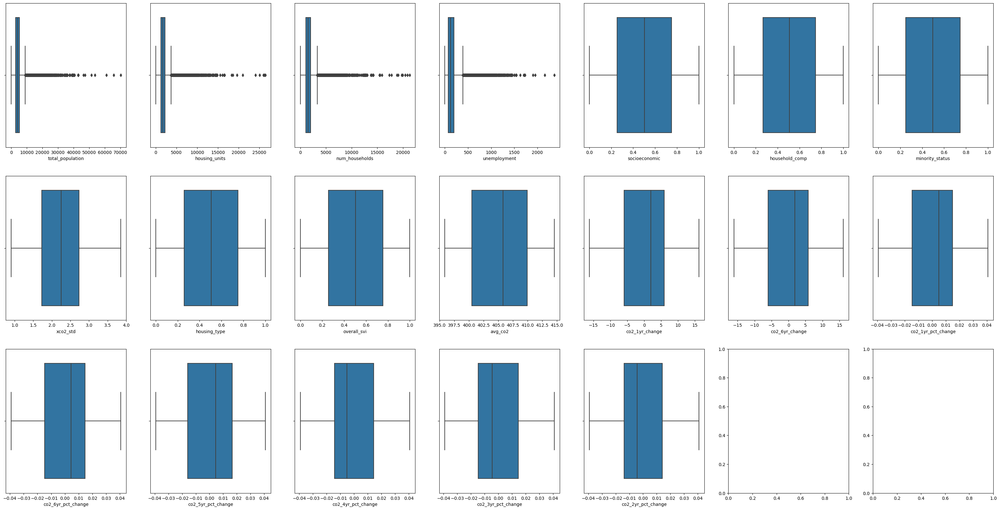

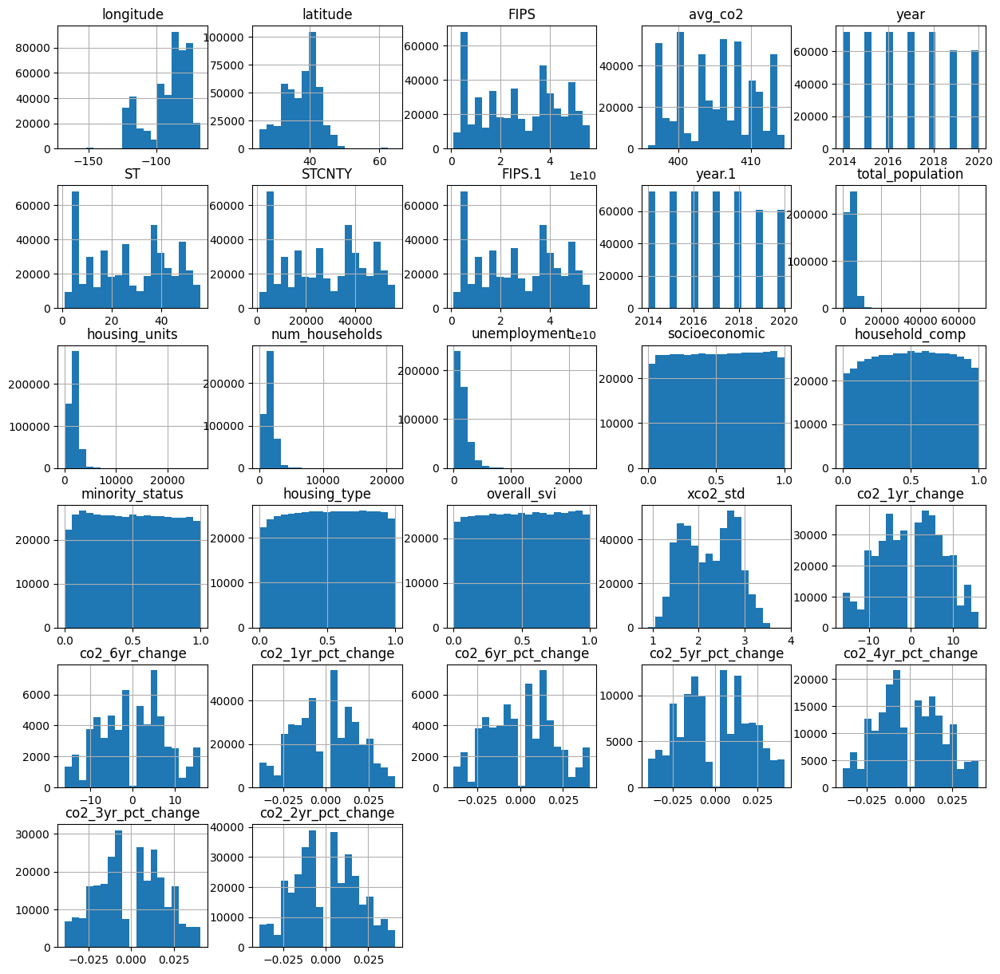

In [4]:
df=df.query('socioeconomic >= 0 & household_comp >= 0 & minority_status >= 0 & housing_type >= 0 and overall_svi >=0')

forplot=df[['total_population', 'housing_units','num_households', 'unemployment', 'socioeconomic', 'household_comp','minority_status', 'housing_type',
        'overall_svi', 'avg_co2', 'xco2_std','co2_1yr_change', 'co2_6yr_change', 'co2_1yr_pct_change','co2_6yr_pct_change',
        'co2_5yr_pct_change', 'co2_4yr_pct_change','co2_3yr_pct_change', 'co2_2yr_pct_change']]

fig, ax =plt.subplots(3,7, figsize=(40, 20))

sns.boxplot(data=forplot, x='total_population', ax=ax[0,0])
sns.boxplot(data=forplot, x='housing_units', ax=ax[0,1])
sns.boxplot(data=forplot, x='num_households', ax=ax[0,2])
sns.boxplot(data=forplot, x='unemployment', ax=ax[0,3])
sns.boxplot(data=forplot, x='socioeconomic', ax=ax[0,4])
sns.boxplot(data=forplot, x='household_comp', ax=ax[0,5])
sns.boxplot(data=forplot, x='minority_status', ax=ax[0,6])

sns.boxplot(data=forplot, x='xco2_std', ax=ax[1,0])
sns.boxplot(data=forplot, x='housing_type', ax=ax[1,1])
sns.boxplot(data=forplot, x='overall_svi', ax=ax[1,2])
sns.boxplot(data=forplot, x='avg_co2', ax=ax[1,3])
sns.boxplot(data=forplot, x='co2_1yr_change', ax=ax[1,4])
sns.boxplot(data=forplot, x='co2_6yr_change', ax=ax[1,5])
sns.boxplot(data=forplot, x='co2_1yr_pct_change', ax=ax[1,6])

sns.boxplot(data=forplot, x='co2_6yr_pct_change', ax=ax[2,0])
sns.boxplot(data=forplot, x='co2_5yr_pct_change', ax=ax[2,1])
sns.boxplot(data=forplot, x='co2_4yr_pct_change', ax=ax[2,2])
sns.boxplot(data=forplot, x='co2_3yr_pct_change', ax=ax[2,3])
sns.boxplot(data=forplot, x='co2_2yr_pct_change', ax=ax[2,4])

df_hist=df[['total_population', 'housing_units','num_households', 'unemployment', 'socioeconomic', 'household_comp','minority_status', 'housing_type',
        'overall_svi', 'avg_co2', 'xco2_std','co2_1yr_change', 'co2_6yr_change', 'co2_1yr_pct_change','co2_6yr_pct_change',
        'co2_5yr_pct_change', 'co2_4yr_pct_change','co2_3yr_pct_change', 'co2_2yr_pct_change']]

#distribution for all years
print('distribution over all years')
df.hist(bins=19, figsize=(15, 15))

### Distributions for individual years

array([[<Axes: title={'center': 'year'}>,
        <Axes: title={'center': 'total_population'}>,
        <Axes: title={'center': 'housing_units'}>,
        <Axes: title={'center': 'num_households'}>],
       [<Axes: title={'center': 'unemployment'}>,
        <Axes: title={'center': 'socioeconomic'}>,
        <Axes: title={'center': 'household_comp'}>,
        <Axes: title={'center': 'minority_status'}>],
       [<Axes: title={'center': 'housing_type'}>,
        <Axes: title={'center': 'overall_svi'}>,
        <Axes: title={'center': 'avg_co2'}>,
        <Axes: title={'center': 'xco2_std'}>],
       [<Axes: title={'center': 'co2_1yr_change'}>,
        <Axes: title={'center': 'co2_6yr_change'}>,
        <Axes: title={'center': 'co2_1yr_pct_change'}>,
        <Axes: title={'center': 'co2_6yr_pct_change'}>],
       [<Axes: title={'center': 'co2_5yr_pct_change'}>,
        <Axes: title={'center': 'co2_4yr_pct_change'}>,
        <Axes: title={'center': 'co2_3yr_pct_change'}>,
        <Axes: ti

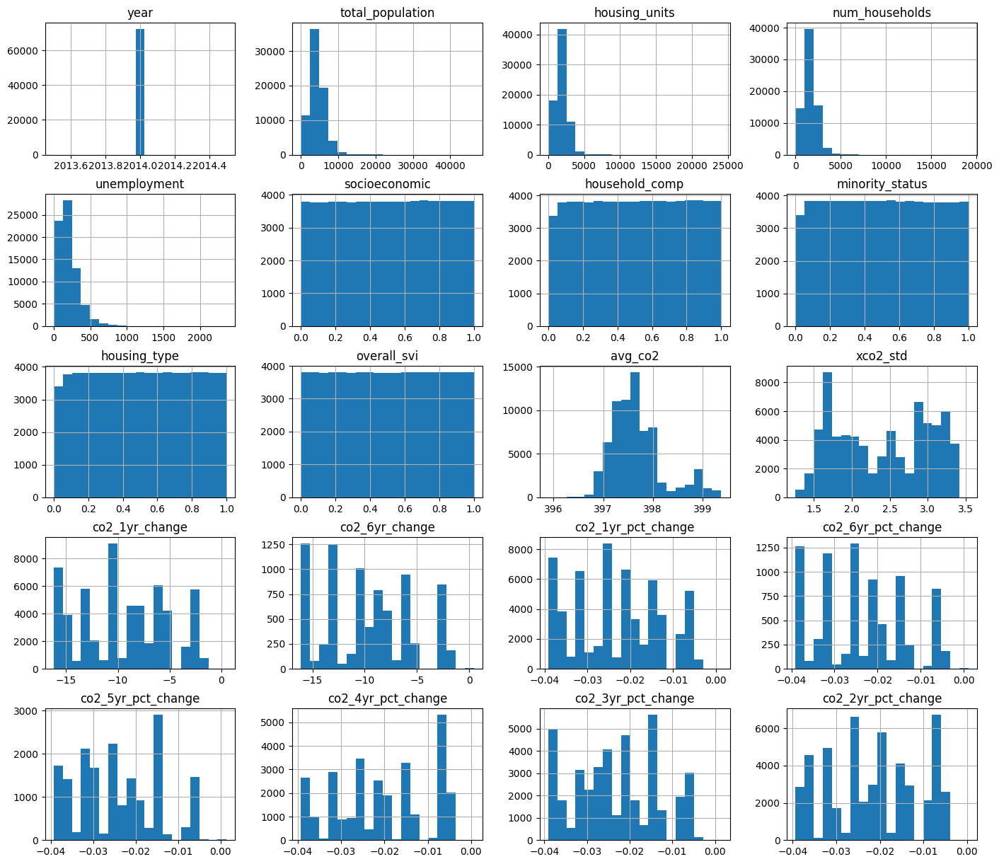

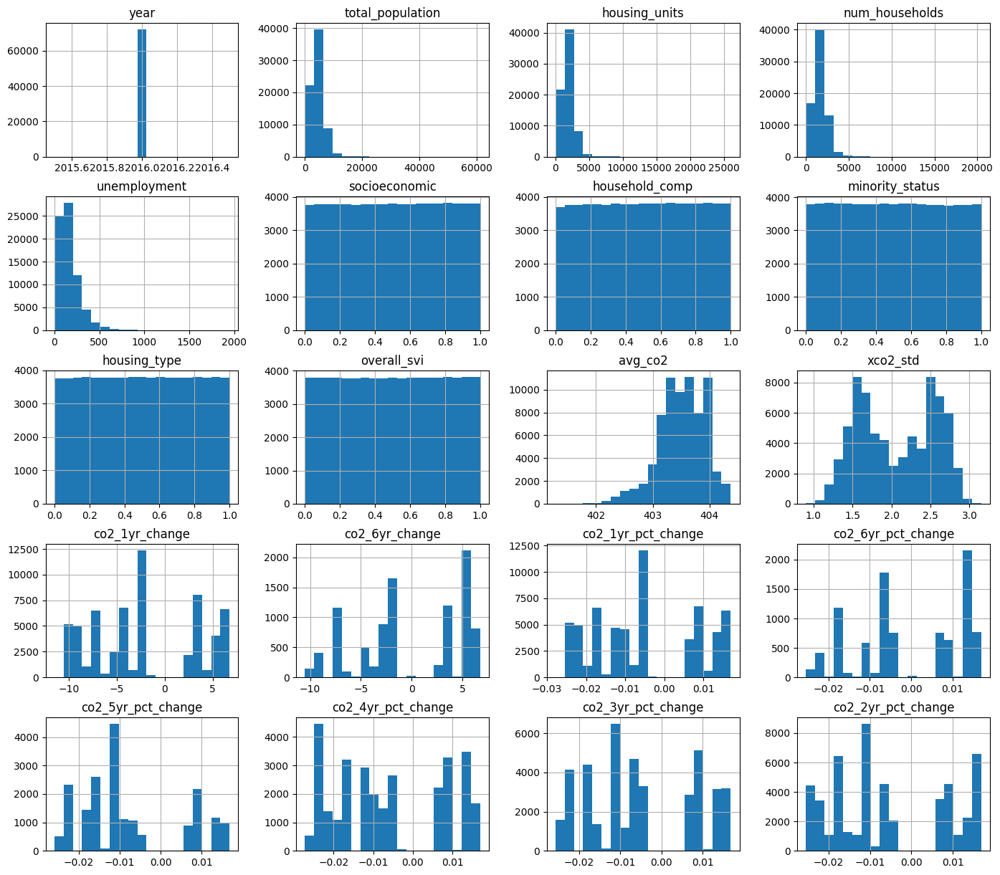

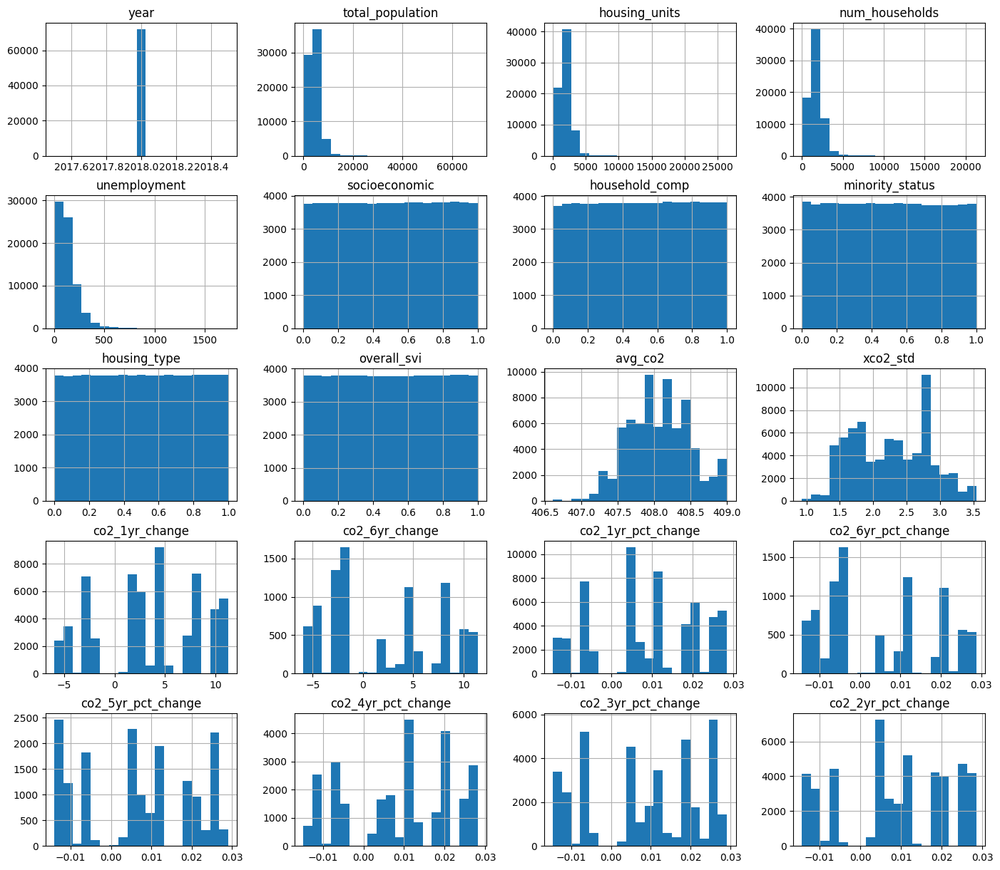

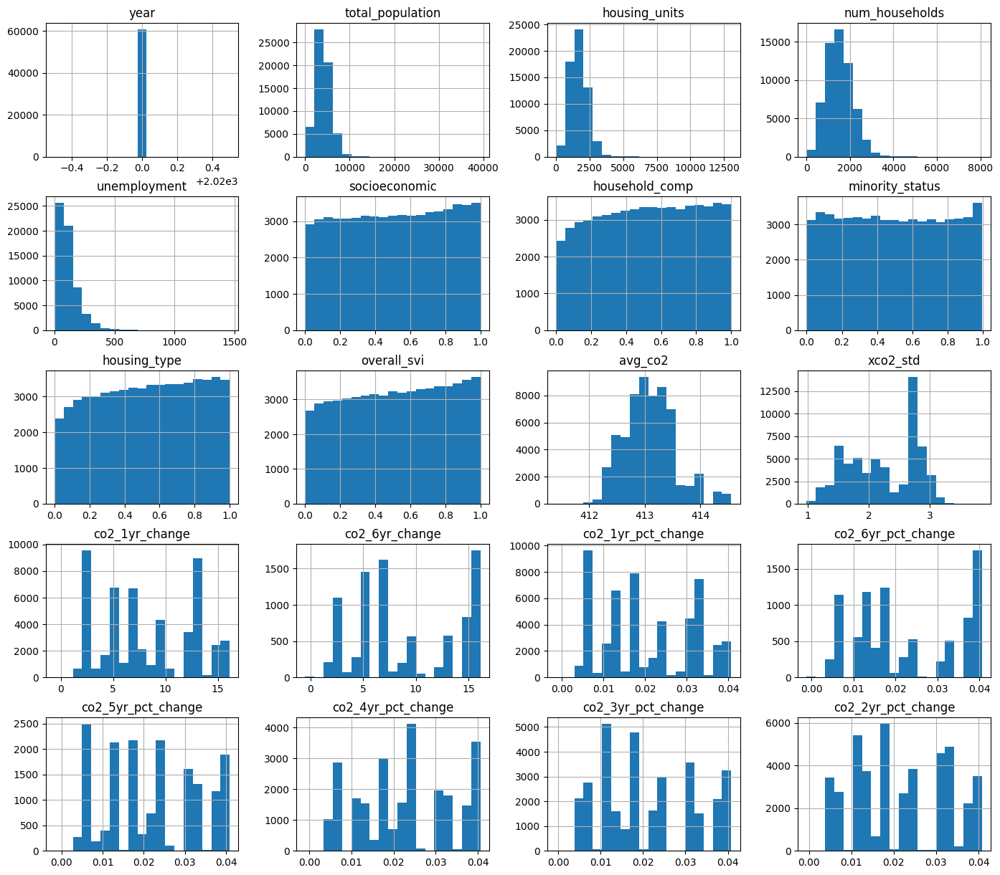

In [7]:
#distribution for 2020
df_hist_2014=df[df['year']==2014]
df_hist_2014=df_hist_2014[['year','total_population', 'housing_units','num_households', 'unemployment', 'socioeconomic', 'household_comp','minority_status', 'housing_type',
        'overall_svi', 'avg_co2', 'xco2_std','co2_1yr_change', 'co2_6yr_change', 'co2_1yr_pct_change','co2_6yr_pct_change',
        'co2_5yr_pct_change', 'co2_4yr_pct_change','co2_3yr_pct_change', 'co2_2yr_pct_change']]


df_hist_2016=df[df['year']==2016]
df_hist_2016=df_hist_2016[['year','total_population', 'housing_units','num_households', 'unemployment', 'socioeconomic', 'household_comp','minority_status', 'housing_type',
        'overall_svi', 'avg_co2', 'xco2_std','co2_1yr_change', 'co2_6yr_change', 'co2_1yr_pct_change','co2_6yr_pct_change',
        'co2_5yr_pct_change', 'co2_4yr_pct_change','co2_3yr_pct_change', 'co2_2yr_pct_change']]


df_hist_2018=df[df['year']==2018]
df_hist_2018=df_hist_2018[['year','total_population', 'housing_units','num_households', 'unemployment', 'socioeconomic', 'household_comp','minority_status', 'housing_type',
        'overall_svi', 'avg_co2', 'xco2_std','co2_1yr_change', 'co2_6yr_change', 'co2_1yr_pct_change','co2_6yr_pct_change',
        'co2_5yr_pct_change', 'co2_4yr_pct_change','co2_3yr_pct_change', 'co2_2yr_pct_change']]


df_hist_2020=df[df['year']==2020]
df_hist_2020=df_hist_2020[['year','total_population', 'housing_units','num_households', 'unemployment', 'socioeconomic', 'household_comp','minority_status', 'housing_type',
        'overall_svi', 'avg_co2', 'xco2_std','co2_1yr_change', 'co2_6yr_change', 'co2_1yr_pct_change','co2_6yr_pct_change',
        'co2_5yr_pct_change', 'co2_4yr_pct_change','co2_3yr_pct_change', 'co2_2yr_pct_change']]




df_hist_2014.hist(bins=19, figsize=(17, 15))
df_hist_2016.hist(bins=19, figsize=(17, 15))
df_hist_2018.hist(bins=19, figsize=(17, 15))
df_hist_2020.hist(bins=19, figsize=(17, 15))

### Pairplots - all years

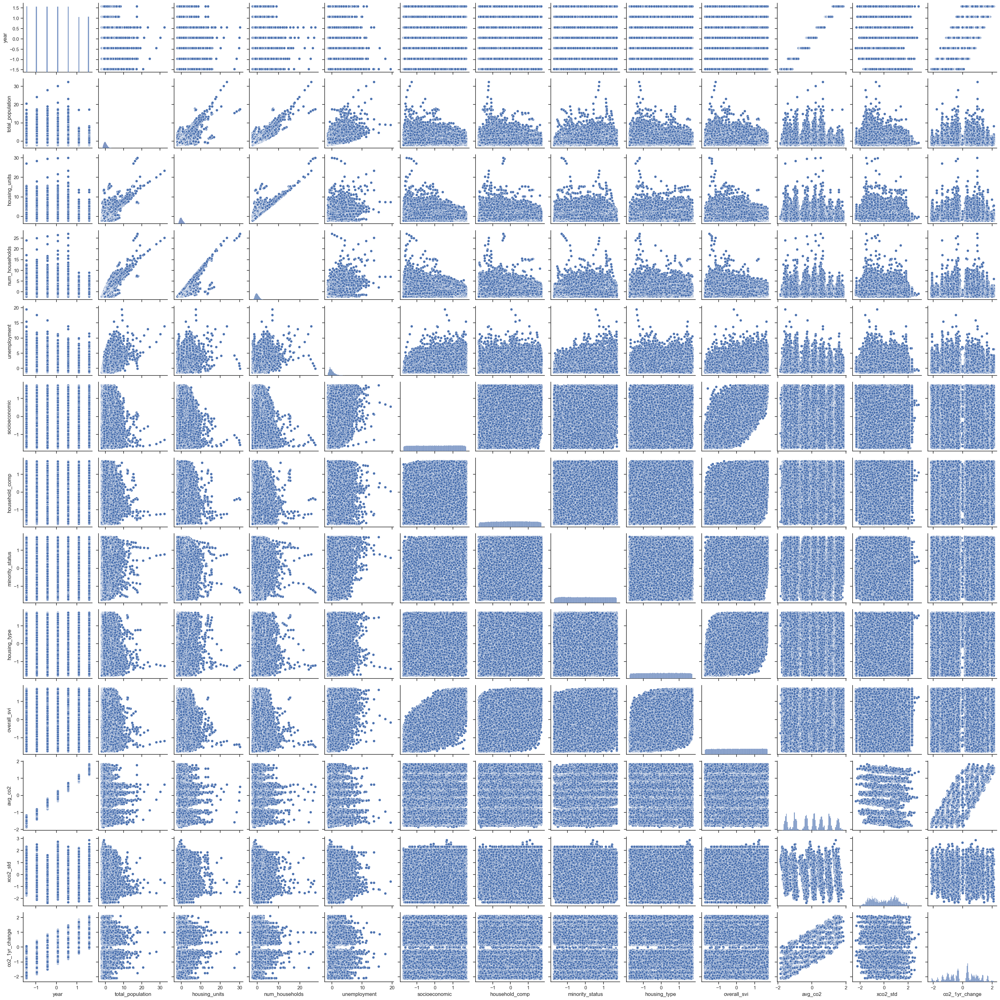

In [36]:
df_numeric=df[['year','total_population','housing_units','num_households','unemployment','socioeconomic','household_comp','minority_status','housing_type','overall_svi', 'avg_co2', 'xco2_std','co2_1yr_change']]
#df_numeric=df_numeric.query('year == 2020')

columns = df_numeric.columns

#Initialize scaler
scaler = StandardScaler()

#scale the data
clus_df = pd.DataFrame(scaler.fit_transform(df_numeric))

#Rename plot_df's columns
clus_df.columns = columns

sns.set(style="ticks")
sns.pairplot(data= clus_df)

### Pairplots - only 2020

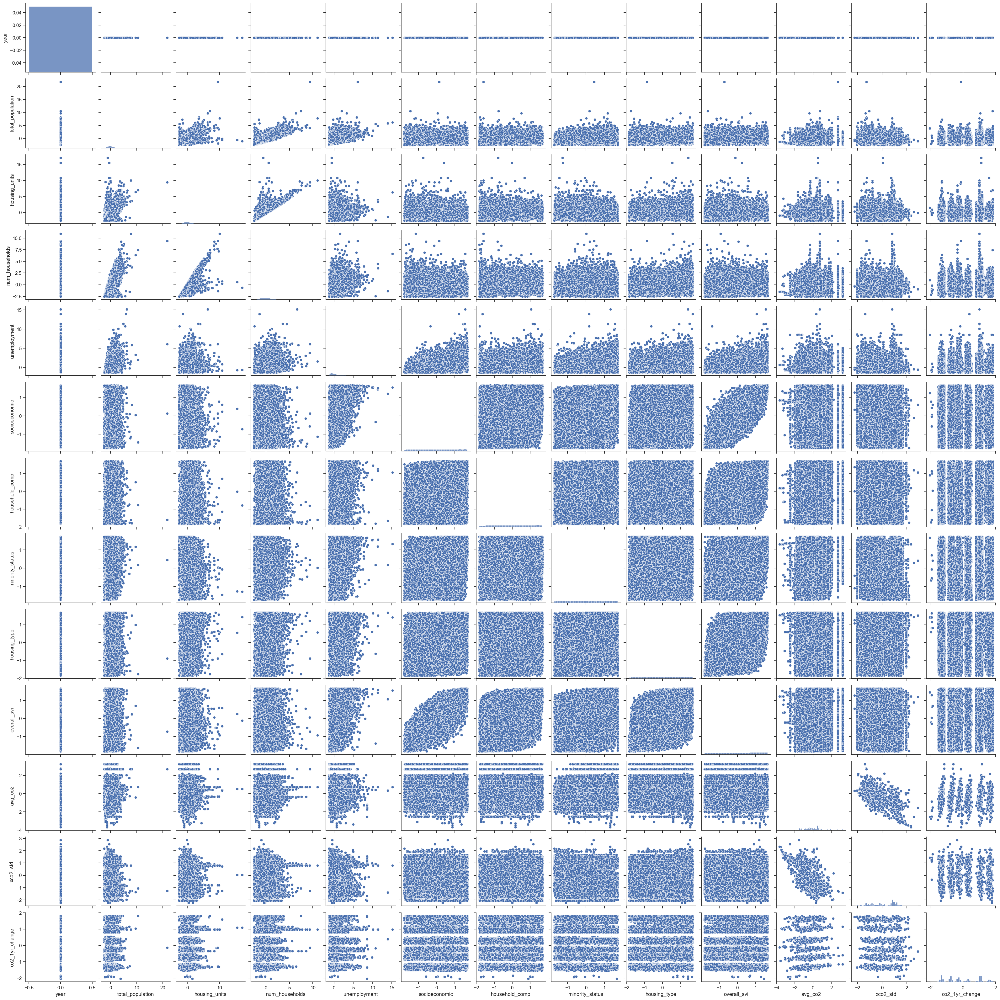

In [9]:
df_numeric=df[['year','total_population','housing_units','num_households','unemployment','socioeconomic','household_comp','minority_status','housing_type','overall_svi', 'avg_co2', 'xco2_std','co2_1yr_change']]
df_numeric=df_numeric.query('year == 2020')

columns = df_numeric.columns

#Initialize scaler
scaler = StandardScaler()

#scale the data
clus_df = pd.DataFrame(scaler.fit_transform(df_numeric))

#Rename plot_df's columns
clus_df.columns = columns

sns.set(style="ticks")
sns.pairplot(data= clus_df)

### Correlation heatmap

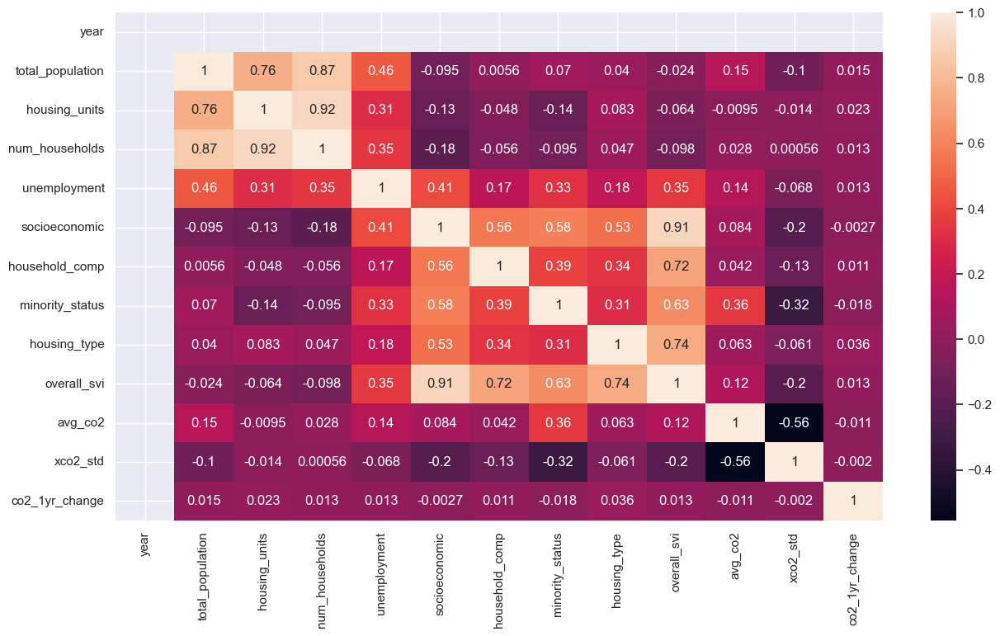

In [11]:
ax = sns.heatmap(df_numeric.corr(), annot=True)
sns.set (rc = {'figure.figsize':(15, 15)})
